# 18.303 Homework 1 Solutions

These solutions accompany the first problem set posted on the [18.303 web page](https://github.com/mitmath/18303). Execute the following code to import some useful linear algebra and plotting utilities used below.

In [151]:
using LinearAlgebra
using Plots

## Problem 2(c)

The $n\times n$ second-order centered difference matrix maps the vector of values $u = (u_1, u_2, \ldots, u_n)^T$ to the vector of approximate derivatives $u' = (u_1',u_2',\ldots,u_n')^T$ for a periodic function sampled at $n$ equispaced points (with spacing $h=1/n$) on the periodic interval $[0, 1)$, where the approximate derivatives are computed via centered difference approximation:
$$
u_k' = \frac{u_{k+1}-u_{k-1}}{2h}, \qquad\text{with}\qquad u_1 = u_{n+1},
$$
Building out the matrix row by row, we collect the approximations into matrix-vector format to get
$$
\begin{pmatrix}
u_1' \\ u_2' \\ \vdots \\ u_n' 
\end{pmatrix}
=
\frac{1}{2h}\begin{pmatrix}
0 & 1 & & & -1 \\
-1 & 0 & 1 & & \\
   &  \ddots & \ddots & \ddots & \\
   & & -1 & 0 & 1 \\
   1 & & & -1 & 0
\end{pmatrix}
\begin{pmatrix}
u_1 \\ u_2 \\ \vdots \\ u_n
\end{pmatrix}.
$$
This matrix is constructed in Julia with the following code snippet.

In [10]:
## build differentiation matrix (0=>ones(n) puts length n vector of ones onto the main diagonal, 1=>ones(n-1) puts length n-1 vector of ones onto the first superdiagonal)
function fdiff2C(n)
    h = 1 / n
    D = diagm(-1 => -ones(n-1), 1 => ones(n-1))
    D[end,1] = 1
    D[1,end] = -1
    D = D / (2*h)
end

# 12 x 12 second-order centered difference matrix
fdiff2C(12)

12×12 Matrix{Float64}:
  0.0   6.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  -6.0
 -6.0   0.0   6.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0
  0.0  -6.0   0.0   6.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0  -6.0   0.0   6.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0  -6.0   0.0   6.0   0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0  -6.0   0.0   6.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0  -6.0   0.0   6.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0   0.0  -6.0   0.0   6.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0   0.0   0.0  -6.0   0.0   6.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  -6.0   0.0   6.0   0.0
  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  -6.0   0.0   6.0
  6.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  -6.0   0.0

Similarly, the $n\times n$ fourth-order centered difference matrix maps the vector of values $u = (u_1, u_2, \ldots, u_n)^T$ to the vector of approximate derivatives $u' = (u_1',u_2',\ldots,u_n')^T$ for a periodic function sampled at $n$ equispaced points (with spacing $h=1/n$) on the periodic interval $[0, 1)$. This time, the approximate derivatives are computed via a higher-order centered difference approximation:
$$
u_k' = \frac{-u_{k+2} + 8u_{k+1} - 8u_{k-1} + u_{k-2}}{12h}.
$$
Building out the matrix row by row again, we collect the approximations into matrix-vector format to get
$$
\begin{pmatrix}
u_1' \\ u_2' \\ \vdots \\ u_n' 
\end{pmatrix}
=
\frac{1}{12h}\begin{pmatrix}
0 & 8 & -1 &  &  & 1 & -8 \\
-8 & 0 & 8 & -1 &  & & 1 \\
1 & -8 & 0 & 8 & -1 & & \\
  & \ddots &  \ddots & \ddots & \ddots & \ddots & \\
   & & 1 & -8 & 0 & 8 & -1 \\
   -1 & & & 1 & -8 & 0 & 8  \\
   8 & -1 &  & & 1 & -8 & 0  \\
\end{pmatrix}
\begin{pmatrix}
u_1 \\ u_2 \\ \vdots \\ u_n
\end{pmatrix}.
$$
This matrix is constructed in Julia with the following code snippet.

In [9]:
## build differentiation matrix (0=>ones(n) puts length n vector of ones onto the main diagonal, 1=>ones(n-1) puts length n-1 vector of ones onto the first superdiagonal)
function fdiff4C(n)
    h = 1 / n
    D = diagm(-(n-2) => -ones(2), -2 => ones(n-2), -1 => -8*ones(n-1), 1 => 8*ones(n-1), 2 => -ones(n-2), n-2 => ones(2))
    D[end,1] = 8
    D[1,end] = -8
    D = D / (12*h)
end

# 12 x 12 fourth-order centered difference matrix
fdiff4C(12)

12×12 Matrix{Float64}:
  0.0   8.0  -1.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   1.0  -8.0
 -8.0   0.0   8.0  -1.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   1.0
  1.0  -8.0   0.0   8.0  -1.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0
  0.0   1.0  -8.0   0.0   8.0  -1.0   0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   1.0  -8.0   0.0   8.0  -1.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   1.0  -8.0   0.0   8.0  -1.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   1.0  -8.0   0.0   8.0  -1.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0   1.0  -8.0   0.0   8.0  -1.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0   0.0   1.0  -8.0   0.0   8.0  -1.0   0.0
  0.0   0.0   0.0   0.0   0.0   0.0   0.0   1.0  -8.0   0.0   8.0  -1.0
 -1.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   1.0  -8.0   0.0   8.0
  8.0  -1.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   1.0  -8.0   0.0

## Problem 2(d)

Here, we show the numerical experiments for part (d) in problem 2. See **hw1_soln.pdf** for explanations of the results.

### Example 1 with $f(x) = \sin(2\pi x)$.

First, we plot the approximation and error for the second-order finite difference approximations of $\sin(2\pi x)$.

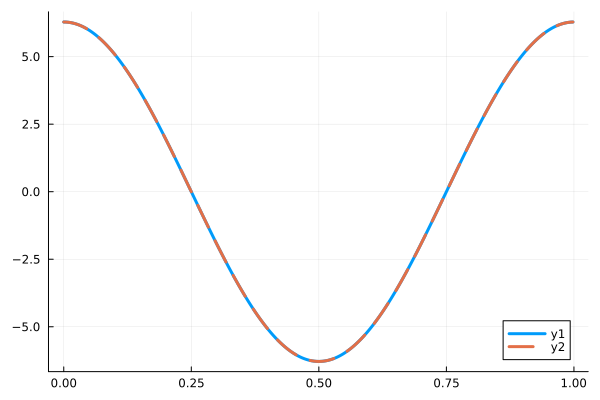

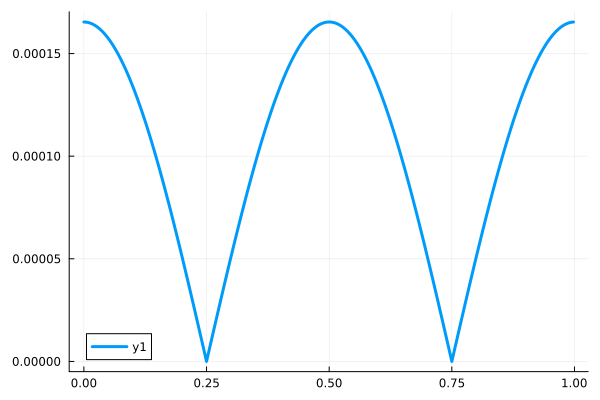

In [21]:
# exact u and u'
u = x -> sin.(2*pi*x)
up = x -> 2*pi*cos.(2*pi*x)

# equally spaced grid on periodic interval [0,1)
n = 500
h = 1/n
xgrid = LinRange(0,1-h,n)

# samples of u and u' on grid
ugrid = u(xgrid)
upgrid = up(xgrid)

# finite difference approximation on grid
D = fdiff2C(n)
fdupgrid = D*ugrid


plot(xgrid, upgrid, lw = 3, ls = :solid)                    # derivative plotted in first plot
display(plot!(xgrid, fdupgrid, lw = 3, ls = :dash))         # dashed line is FD approximation
display(plot(xgrid, abs.(fdupgrid-upgrid), lw = 3))         # absolute error in second plot

We get about 3 digits of accuracy with the second order scheme. Here are the same plots for the the fourth-order finite difference approximations of $\sin(2\pi x)$.

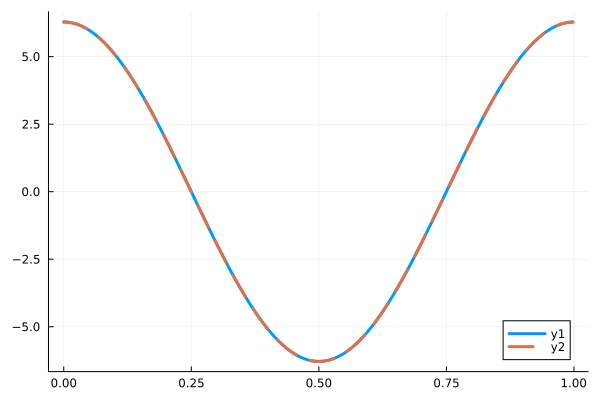

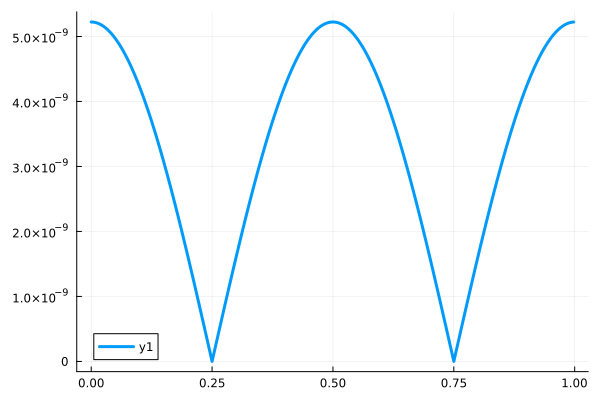

In [22]:
# exact u and u'
u = x -> sin.(2*pi*x)
up = x -> 2*pi*cos.(2*pi*x)

# equally spaced grid on periodic interval [0,1)
n = 500
h = 1/n
xgrid = LinRange(0,1-h,n)

# samples of u and u' on grid
ugrid = u(xgrid)
upgrid = up(xgrid)

# finite difference approximation on grid
D = fdiff4C(n)
fdupgrid = D*ugrid


plot(xgrid, upgrid, lw = 3, ls = :solid)                    # derivative plotted in first plot
display(plot!(xgrid, fdupgrid, lw = 3, ls = :dash))         # dashed line is FD approximation
display(plot(xgrid, abs.(fdupgrid-upgrid), lw = 3))         # absolute error in second plot

We get about 8 digits of accuracy with the fourth order scheme. Here is a plot showing the refinement in accuracy as $h\rightarrow 0$ for both schemes.

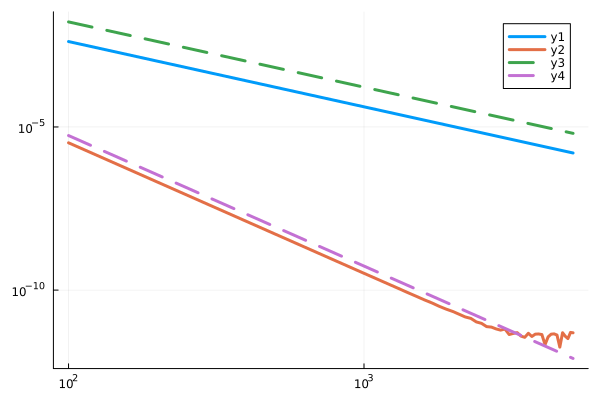

In [23]:
err2C = zeros(51)
err4C = zeros(51)
nvals = 100*collect(1:51)
for indx = 1:51
    
    # size of grid
    n = nvals[indx]
    h = 1/n

    # equally spaced grid on periodic interval [0,1)
    xgrid = LinRange(0,1-h,n)

    # samples of u and u' on grid
    ugrid = u(xgrid)
    upgrid = up(xgrid)

    # 2nd centered finite difference approximation on grid
    D2C = fdiff2C(n)
    fd2Cupgrid = D2C*ugrid

    # 4th centered finite difference approximation on grid
    D4C = fdiff4C(n)
    fd4Cupgrid = D4C*ugrid

    # maximum value on the grid
    err2C[indx] = maximum(abs.(upgrid-fd2Cupgrid))
    err4C[indx] = maximum(abs.(upgrid-fd4Cupgrid))
end

# plot errors on log-log axis so that algebraic convergence is a straight line
plot(nvals, err2C, lw = 3, xscale = :log10, yscale = :log10)
plot!(nvals, err4C, lw = 3, xscale = :log10, yscale = :log10)
plot!(nvals, (2 * pi)^3 * 2 ./ 3 ./ nvals.^2, lw = 3, ls = :dash)        # dashed line = 2nd order error bound from solutions
plot!(nvals, (2 * pi)^5 ./ 18 ./ nvals.^4, lw = 3, ls = :dash )          # dashed line = 4th order error bound from solutions

The difference schemes converge at the expected rates and the error bounds derived in the solution notes are quite descriptive of the observed errors. The plateu in the fourther order scheme is due to round-off error when the difference is calculated in floating point arithmetic on the computer.  

### Example 2 with $f(x) = \cos(\pi (x-0.5))$.

First, we plot the approximation and error for the second-order finite difference approximations of $\cos(\pi (x-0.5))$.

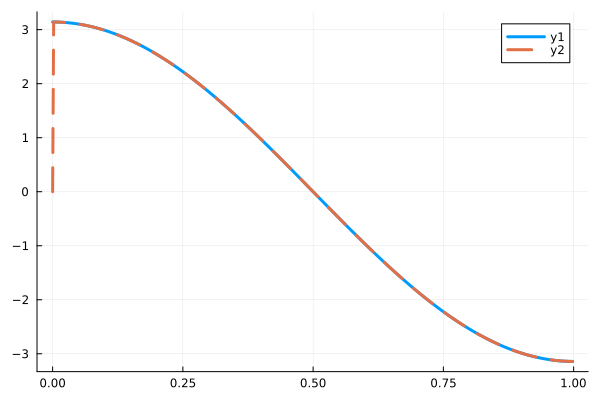

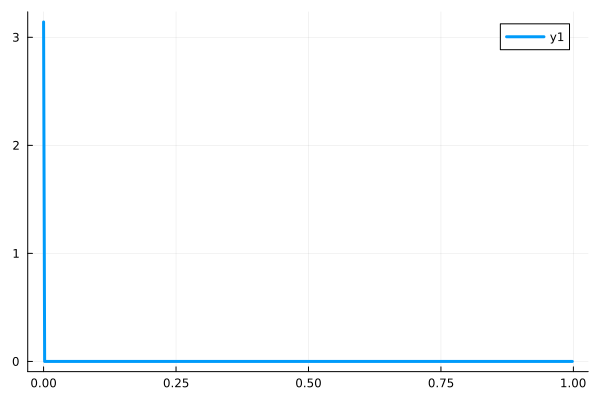

In [24]:
# exact u and u'
u = x -> cos.(pi*(x.-0.5))
up = x -> -pi*sin.(pi*(x.-0.5))

# equally spaced grid on periodic interval [0,1)
n = 500
h = 1/n
xgrid = LinRange(0,1-h,n)

# samples of u and u' on grid
ugrid = u(xgrid)
upgrid = up(xgrid)

# finite difference approximation on grid
D = fdiff2C(n)
fdupgrid = D*ugrid


plot(xgrid, upgrid, lw = 3, ls = :solid)                    # derivative plotted in first plot
display(plot!(xgrid, fdupgrid, lw = 3, ls = :dash))         # dashed line is FD approximation
display(plot(xgrid, abs.(fdupgrid-upgrid), lw = 3))         # absolute error in second plot

The approximation looks okay, except at the right-most gridpoint of the interval. Here are the same plots for the the fourth-order finite difference approximations of $\cos(\pi (x-0.5))$.

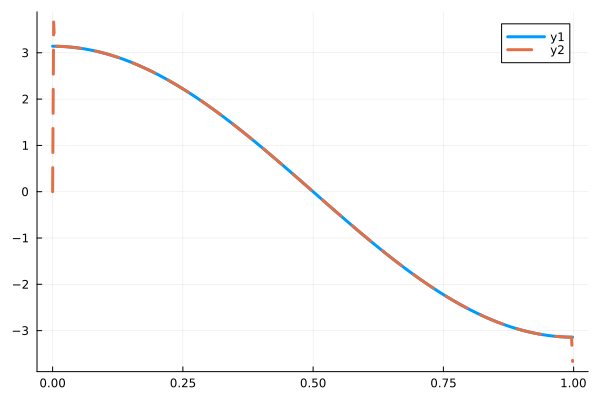

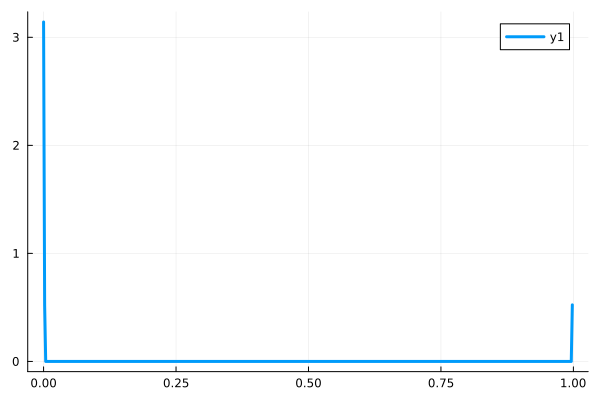

In [25]:
# exact u and u'
u = x -> cos.(pi*(x.-0.5))
up = x -> -pi*sin.(pi*(x.-0.5))

# equally spaced grid on periodic interval [0,1)
n = 500
h = 1/n
xgrid = LinRange(0,1-h,n)

# samples of u and u' on grid
ugrid = u(xgrid)
upgrid = up(xgrid)

# finite difference approximation on grid
D = fdiff4C(n)
fdupgrid = D*ugrid


plot(xgrid, upgrid, lw = 3, ls = :solid)                    # derivative plotted in first plot
display(plot!(xgrid, fdupgrid, lw = 3, ls = :dash))         # dashed line is FD approximation
display(plot(xgrid, abs.(fdupgrid-upgrid), lw = 3))         # absolute error in second plot

Again, everything looks okay **except** at the endpoints of the interval. This is because the function is differentiable within the interval $[0,1)$, but not differentiable on the _periodic interval_ $[0,1)$. Consequently, neither approximation converges uniformly (although they both converge at grid points away from the discontinuity at the endpoint).

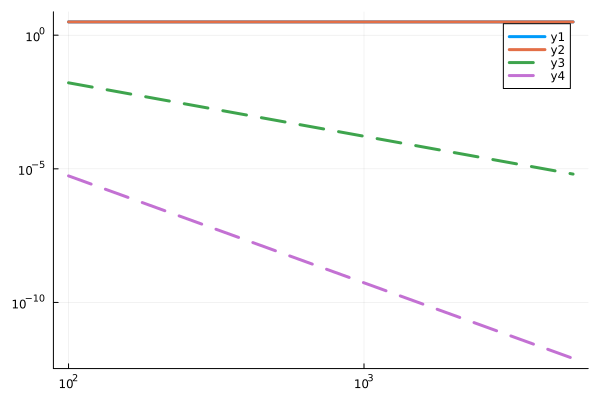

In [26]:
err2C = zeros(51)
err4C = zeros(51)
nvals = 100*collect(1:51)
for indx = 1:51
    
    # size of grid
    n = nvals[indx]
    h = 1/n

    # equally spaced grid on periodic interval [0,1)
    xgrid = LinRange(0,1-h,n)

    # samples of u and u' on grid
    ugrid = u(xgrid)
    upgrid = up(xgrid)

    # 2nd centered finite difference approximation on grid
    D2C = fdiff2C(n)
    fd2Cupgrid = D2C*ugrid

    # 4th centered finite difference approximation on grid
    D4C = fdiff4C(n)
    fd4Cupgrid = D4C*ugrid

    # maximum value on the grid
    err2C[indx] = maximum(abs.(upgrid-fd2Cupgrid))
    err4C[indx] = maximum(abs.(upgrid-fd4Cupgrid))
end

# plot errors on log-log axis so that algebraic convergence is a straight line
plot(nvals, err2C, lw = 3, xscale = :log10, yscale = :log10)
plot!(nvals, err4C, lw = 3, xscale = :log10, yscale = :log10)
plot!(nvals, (2 * pi)^3 * 2 ./ 3 ./ nvals.^2, lw = 3, ls = :dash)        # dashed line = 2nd order error bound from solutions
plot!(nvals, (2 * pi)^5 ./ 18 ./ nvals.^4, lw = 3, ls = :dash )          # dashed line = 4th order error bound from solutions

### Example 3 with $f(x) = \sqrt{(1+\cos(2\pi x))^3}$.

First, we plot the approximation and error for the second-order finite difference approximations of $\sqrt{(1+\cos(2\pi x))^3}$.

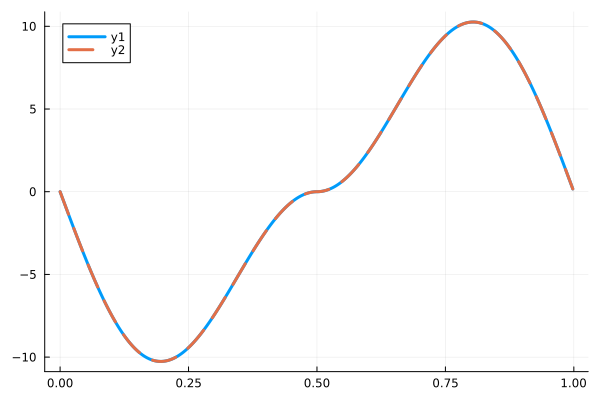

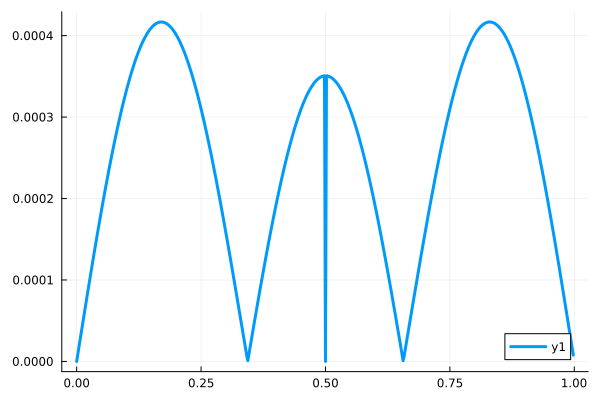

In [27]:
# exact u and u'
u = x -> sqrt.((1 .+ cos.(2*pi*x)).^3)
up = x -> (3/2)*sqrt.(1 .+ cos.(2*pi*x)) .*(-2*pi*sin.(2*pi*x))

# equally spaced grid on periodic interval [0,1)
n = 500
h = 1/n
xgrid = LinRange(0,1-h,n)

# samples of u and u' on grid
ugrid = u(xgrid)
upgrid = up(xgrid)

# finite difference approximation on grid
D = fdiff2C(n)
fdupgrid = D*ugrid


plot(xgrid, upgrid, lw = 3, ls = :solid)                    # derivative plotted in first plot
display(plot!(xgrid, fdupgrid, lw = 3, ls = :dash))         # dashed line is FD approximation
display(plot(xgrid, abs.(fdupgrid-upgrid), lw = 3))         # absolute error in second plot

We get about 3 digits of accuracy with the second order scheme. Here are the same plots for the the fourth-order finite difference approximations of $\sqrt{(1+\cos(2\pi x))^3}$.

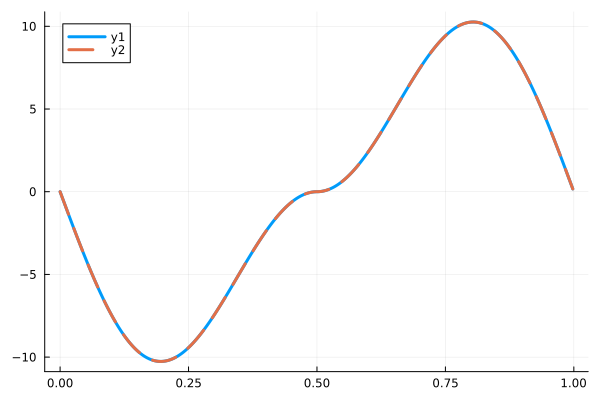

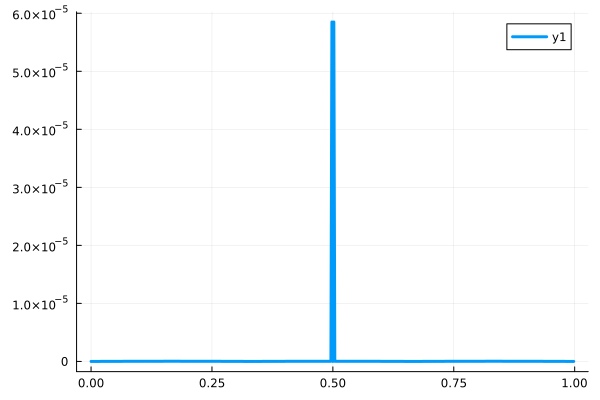

In [28]:
# exact u and u'
u = x -> sqrt.((1 .+ cos.(2*pi*x)).^3)
up = x -> (3/2)*sqrt.(1 .+ cos.(2*pi*x)) .*(-2*pi*sin.(2*pi*x))

# equally spaced grid on periodic interval [0,1)
n = 500
h = 1/n
xgrid = LinRange(0,1-h,n)

# samples of u and u' on grid
ugrid = u(xgrid)
upgrid = up(xgrid)

# finite difference approximation on grid
D = fdiff4C(n)
fdupgrid = D*ugrid


plot(xgrid, upgrid, lw = 3, ls = :solid)                    # derivative plotted in first plot
display(plot!(xgrid, fdupgrid, lw = 3, ls = :dash))         # dashed line is FD approximation
display(plot(xgrid, abs.(fdupgrid-upgrid), lw = 3))         # absolute error in second plot

The accuracy is still improved, but it has only improved a little near the center of the interval. The error there is orders of magnitude larger than anywhere else on the interval. Here is a plot showing the behavior of the maximum error on the grid for both schemes as $h\rightarrow 0$.

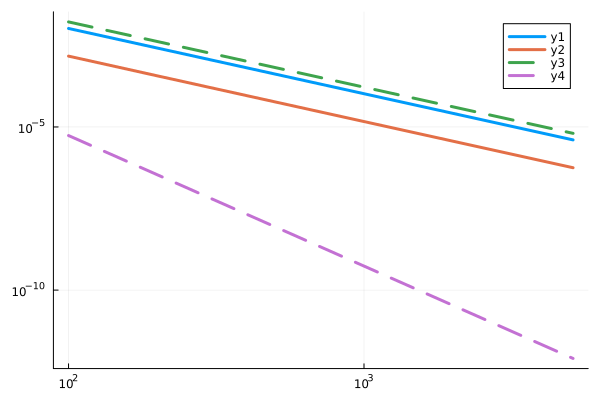

In [30]:
err2C = zeros(51)
err4C = zeros(51)
nvals = 100*collect(1:51)
for indx = 1:51
    
    # size of grid
    n = nvals[indx]
    h = 1/n

    # equally spaced grid on periodic interval [0,1)
    xgrid = LinRange(0,1-h,n)

    # samples of u and u' on grid
    ugrid = u(xgrid)
    upgrid = up(xgrid)

    # 2nd centered finite difference approximation on grid
    D2C = fdiff2C(n)
    fd2Cupgrid = D2C*ugrid

    # 4th centered finite difference approximation on grid
    D4C = fdiff4C(n)
    fd4Cupgrid = D4C*ugrid

    # maximum value on the grid
    err2C[indx] = maximum(abs.(upgrid-fd2Cupgrid))
    err4C[indx] = maximum(abs.(upgrid-fd4Cupgrid))
end

# plot errors on log-log axis so that algebraic convergence is a straight line
plot(nvals, err2C, lw = 3, xscale = :log10, yscale = :log10)            # blue line = 2nd order scheme approx error
plot!(nvals, err4C, lw = 3, xscale = :log10, yscale = :log10)           # red line = 4th order scheme approx error
plot!(nvals, (2 * pi)^3 * 2 ./ 3 ./ nvals.^2, lw = 3, ls = :dash)        # dashed line = 2nd order error bound from solutions
plot!(nvals, (2 * pi)^5 ./ 18 ./ nvals.^4, lw = 3, ls = :dash )          # dashed line = 4th order error bound from solutions

The maximum error on the grid decreases in proportion to $h^2$ for both schemes! This can be explained by the fact that the function in this example is only twice continuously differentiable at the midpoint of the periodic interval.

## Problem 3(a)

Here, we plot a few characteristic curves derived in the part (a) solutions in **hw1_soln.pdf**, for values of $x(0)\in[-1, 1]$. Note that when $x(0)>0$, the characteristics blow up ($x(t)\rightarrow\infty$) in finite time at $t_c = 1/x(0)$. 

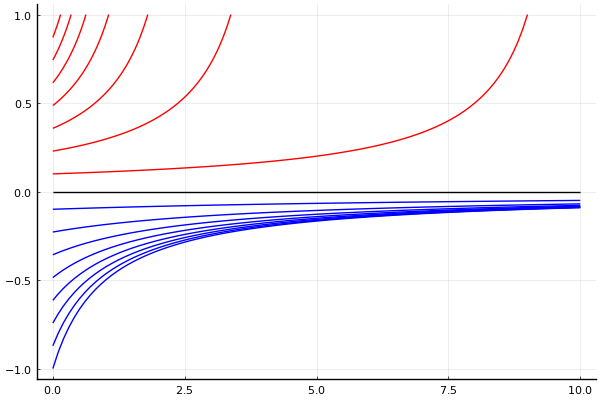

In [149]:
# characteristic curves
xcurve = (x0, t) -> x0 ./ (1 .- x0.*t)

# computational grid in time (100 equispaced pts between 0 and 10)
ntpts = 100
tpts = collect(LinRange(0,10,ntpts))

# first plot zero characteristic (black)
plot(tpts, xcurve(0.0,tpts), linecolor = :black, legend = false)

# then characteristics from x0 < 0 (blue)
nxpts = 8
xpts = LinRange(-1,-0.1,nxpts)
for x0 in xpts
    plot!(tpts, xcurve(x0, tpts), linecolor = :blue, legend = false)
end

# finally, plot characteristics for x0 > 0
nxpts = 8
xpts = LinRange(0.1, 1, nxpts)
for x0 in xpts
    tpts = collect(LinRange(0, 1/x0-1,ntpts))           # don't go past finite-blow time at 1/x0
    plot!(tpts, minimum([1.1*ones(ntpts) sign.(xcurve(x0, tpts)).*xcurve(x0, tpts)], dims=2), linecolor = :red, legend = false)
end
plot!(tpts, minimum([1.1*ones(ntpts) sign.(xcurve(1, tpts)).*xcurve(1,tpts)], dims=2), linecolor = :red, legend = false)

The characteristics with to $x(0)<0$ all have a horizontal asymptote at $x=0$, while each characteristic with $x(0)>0$ has a vertical asymptote at $1/x(0)$.

## Problem 3(d)

The following code snippet combines the forward Euler method in time with the centered second-order finite-difference discretization in space to solve the first-order transport equation

$$
\partial_t u(x,t) + x^2 \partial_x u(x,t) = 0, \qquad\text{where}\qquad u(x,0) = \exp(-100(x-0.5)^2).
$$

┌ Info: Saved animation to C:\Users\phros\AppData\Local\Temp\jl_HyKhJKsToF.gif
└ @ Plots C:\Users\phros\.julia\packages\Plots\M4dfL\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\phros\\AppData\\Local\\Temp\\jl_HyKhJKsToF.gif")
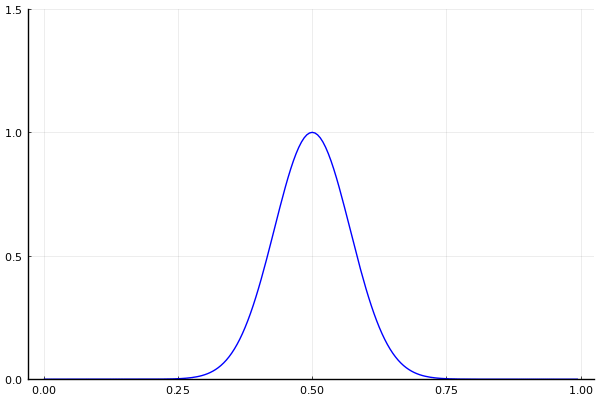

In [154]:
# computational grid = periodic interval [0, 1)
n = 200
h = 1/n
xgrid = LinRange(0,1-h,n)

# spatial discretization
D = fdiff2C(n)              # first partial derivative with respect to spatial variable
Mx = diagm(0 => xgrid.^2)   # multiplication by x^2 on grid
L = -Mx * D                 # discretization of differential operator [Lu](x) = x^2 du/dx

# time stepping (step forward in time with time-step h_t using Forward Euler)
ht = 0.01                   # time step
function time_step(L,u1,ht)
    u2 = u1 + ht * L*u1
end

# initial condition
u1 = exp.(-100*(xgrid .- 0.5).^2)

# time stepping gif
anim = Animation()
m = 200                         # number of steps in time 
for k ∈ 1:m                     # animate solution
    plot(xgrid, u1, linecolor = :blue, legend = false)
    ylims!(0.0,1.5)
    u1 = time_step(L,u1,ht)
    frame(anim)
end
gif(anim)

The Gaussian peak travels to the right, broading as the characteristics starting closer to $x(0)=1$ carry information to the right faster than the characteristics starting nearer to $x(0)=0$. The numerical solution breaks down when the right-most side of the Gaussian peak encounters the right periodic boundary at $x=1$. This is, in part, because the characteristic curves on the interior of $[0,1)$ collide with the $x(0)=0$ characteristic at the periodic boundary point $x=1$. It is also interesting to note that the amplitude of the Gaussian increases slightly from the beginning of the solution to the time when the numerical solution breaks down.

The next code snippet combines the forward Euler method in time with the centered fourth-order finite-difference discretization in space.

┌ Info: Saved animation to C:\Users\phros\AppData\Local\Temp\jl_J48FJGEVrz.gif
└ @ Plots C:\Users\phros\.julia\packages\Plots\M4dfL\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\phros\\AppData\\Local\\Temp\\jl_J48FJGEVrz.gif")
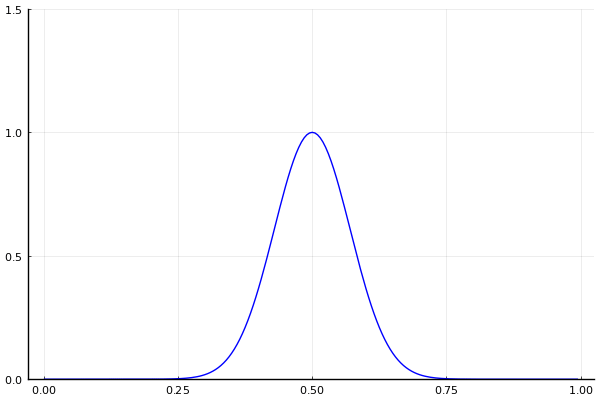

In [159]:
# computational grid = periodic interval [0, 1)
n = 200
h = 1/n
xgrid = LinRange(0,1-h,n)

# spatial discretization
D = fdiff4C(n)              # first partial derivative with respect to spatial variable
Mx = diagm(0 => xgrid.^2)   # multiplication by x^2 on grid
L = -Mx * D                 # discretization of differential operator [Lu](x) = x^2 du/dx

# time stepping (step forward in time with time-step h_t using Forward Euler)
ht = 0.01                   # time step
function time_step(L,u1,ht)
    u2 = u1 + ht * L*u1
end

# initial condition
u1 = exp.(-100*(xgrid .- 0.5).^2)

# time stepping gif
anim = Animation()
m = 200                         # number of steps in time 
for k ∈ 1:m                     # animate solution
    plot(xgrid, u1, linecolor = :blue, legend = false)
    ylims!(0.0,1.5)
    u1 = time_step(L,u1,ht)
    frame(anim)
end
gif(anim)